In [1]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.config.set_visible_devices([], 'GPU')

In [2]:
# Paths
image_dir = "/Users/rfalcao/Documents/FYP/ManualSegmentationAnns/cusp_images"
mask_dir = "/Users/rfalcao/Documents/FYP/ManualSegmentationAnns/masks"


# Image settings
IMG_SIZE = 224  # Input size for U-Net

# Augmentation settings
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to load images, augment them, and pad them to the max size
def load_and_augment_images(image_dir, mask_dir):
    images, masks = [], []

    for filename in os.listdir(image_dir):
        img_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir, filename)

        # Load image and mask
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if img is None or mask is None:
            print(f"Skipping {filename} (missing image or mask)")
            continue
        
        # Normalize image
        img = img.astype(np.float32) / 255.0
        mask = mask.astype(np.float32) / 255.0

        # Reshaping for augmentation
        img = np.expand_dims(img, axis=-1)  # Add channel dimension
        mask = np.expand_dims(mask, axis=-1)  # Add channel dimension

        # Apply augmentation
        seed = np.random.randint(10000)
        augmented_img = datagen.random_transform(img, seed=seed)
        augmented_mask = datagen.random_transform(mask, seed=seed)

        # Ensure consistent shape (resize to IMG_SIZE before appending)
        augmented_img = cv2.resize(augmented_img, (IMG_SIZE, IMG_SIZE))
        augmented_mask = cv2.resize(augmented_mask, (IMG_SIZE, IMG_SIZE))

        # Append the augmented images and masks
        images.append(augmented_img)
        masks.append(augmented_mask)

    return np.array(images), np.array(masks)

# Load and augment images
augmented_images, augmented_masks = load_and_augment_images(image_dir, mask_dir)

Unique pixel values in the mask image: [  0   1   2   3   4   5   6   7 248 249 250 251 252 253 254 255]
Unique pixel values in the adjusted mask image: [  0 255]


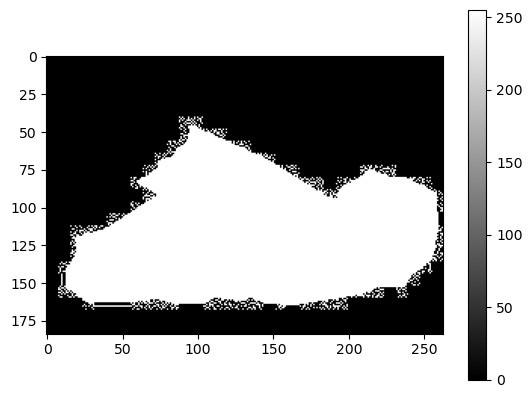

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
image_p = "/Users/rfalcao/Documents/FYP/ManualSegmentationAnns/masks/cusp_1.jpg"

# Read the image
img = cv2.imread(image_p, cv2.IMREAD_UNCHANGED)

# Print unique pixel values
unique_values = np.unique(img)
print("Unique pixel values in the mask image:", unique_values)

# Adjust pixel values to have a bigger difference
adjusted_img = img.copy()
adjusted_img[adjusted_img > 150] = 255  # Change 1 to 85
adjusted_img[adjusted_img < 150] = 0

# Print unique pixel values after adjustment
adjusted_unique_values = np.unique(adjusted_img)
print("Unique pixel values in the adjusted mask image:", adjusted_unique_values)

# Display the adjusted image
plt.imshow(adjusted_img, cmap='gray')
plt.colorbar()
plt.show()

In [4]:
NUM_CLASSES = 1
IMG_SIZE = 224  # Input size for U-Net
from metrics import log_dice_loss , dice_coef, iou
def unet_model(input_size=(IMG_SIZE, IMG_SIZE, 1)):
    inputs = Input(input_size)

    # Contracting path
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2))(conv2)

    # Bottleneck
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)

    # Expansive path
    up1 = UpSampling2D((2, 2))(conv3)
    concat1 = Concatenate()([up1, conv2])
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat1)

    up2 = UpSampling2D((2, 2))(conv4)
    concat2 = Concatenate()([up2, conv1])
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat2)

    # Final segmentation map
    output = Conv2D(NUM_CLASSES, (1, 1), activation='sigmoid')(conv5)

    model = Model(inputs, output)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss=log_dice_loss, metrics=[dice_coef, iou])
    return model


# Create and train model
model = unet_model()
model.summary()




Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 224, 224,  │        640 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 112, 112,  │          0 │ conv2d_6[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 112, 112,  │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 56, 56,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 56, 56,    │    295,168 │ max_pooling2d_3[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 112, 112,  │          0 │ conv2d_8[0][0]    │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 112, 112,  │          0 │ up_sampling2d_2[… │
│ (Concatenate)       │ 384)              │            │ conv2d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 112, 112,  │    442,496 │ concatenate_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_3     │ (None, 224, 224,  │          0 │ conv2d_9[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 224, 224,  │          0 │ up_sampling2d_3[… │
│ (Concatenate)       │ 192)              │            │ conv2d_6[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 224, 224,  │    110,656 │ concatenate_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 224, 224,  │         65 │ conv2d_10[0][0]   │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 922,881 (3.52 MB)

 Trainable params: 922,881 (3.52 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
history = model.fit(
    augmented_images, augmented_masks,
    epochs=10,
    batch_size=32,
    validation_split=0.2  # 20% of training data used as validation (like before)
)

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 64s 10s/step - dice_coef: 0.4062 - iou: 0.2213 - loss: 0.9236 - val_dice_coef: 0.4099 - val_iou: 0.3020 - val_loss: 0.9260
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 60s 10s/step - dice_coef: 0.4219 - iou: 0.3133 - loss: 0.8312 - val_dice_coef: 0.4412 - val_iou: 0.3020 - val_loss: 0.8526
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 64s 11s/step - dice_coef: 0.4850 - iou: 0.3459 - loss: 0.7567 - val_dice_coef: 0.4689 - val_iou: 0.3020 - val_loss: 0.7945
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 74s 12s/step - dice_coef: 0.4926 - iou: 0.3211 - loss: 0.7160 - val_dice_coef: 0.4754 - val_iou: 0.3020 - val_loss: 0.7845
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 74s 12s/step - dice_coef: 0.4910 - iou: 0.3156 - loss: 0.7150 - val_dice_coef: 0.4735 - val_iou: 0.3020 - val_loss: 0.7898
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 73s 12s/step - dice_coef: 0.5030 - iou: 0.3268 - loss: 0.6912 - val_dice_coef: 0.4743 - val_iou: 0.3020 - val_loss: 0.7879
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 75s 12s/st

In [31]:
model.save('Unet1AUG.h5')

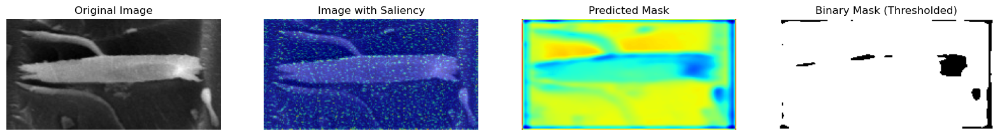

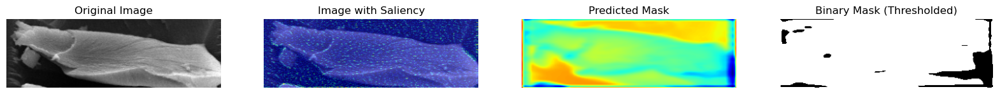

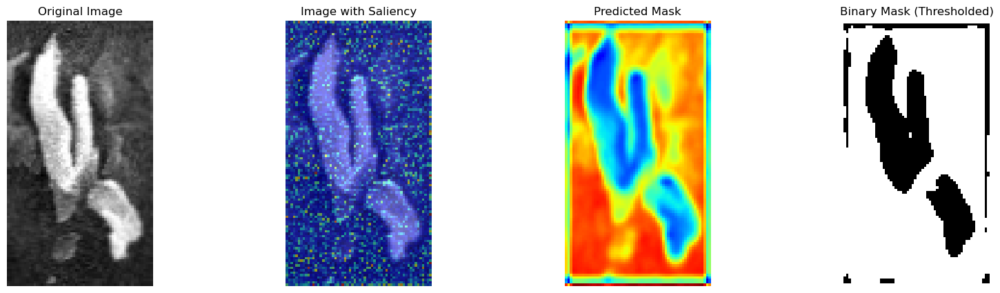

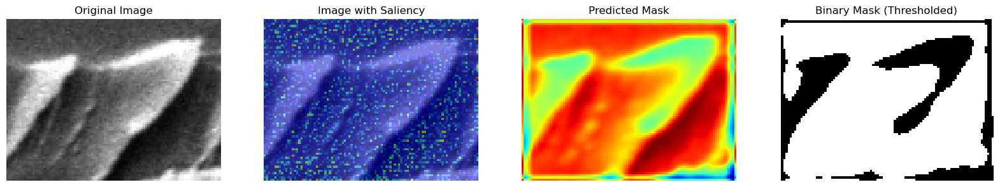

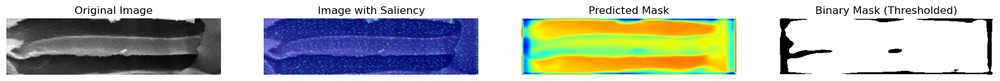

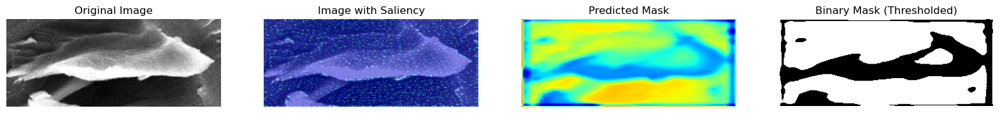

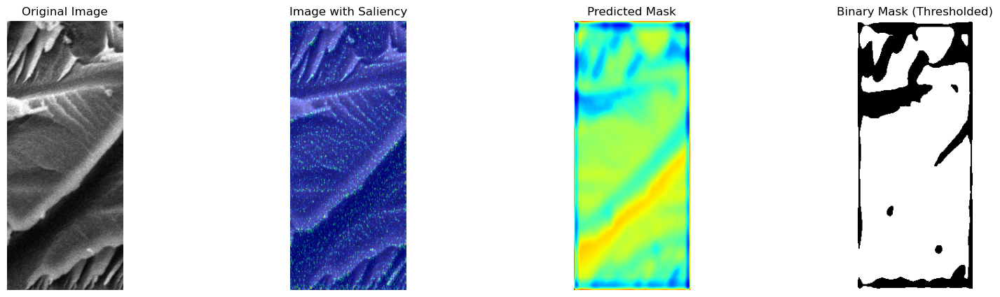

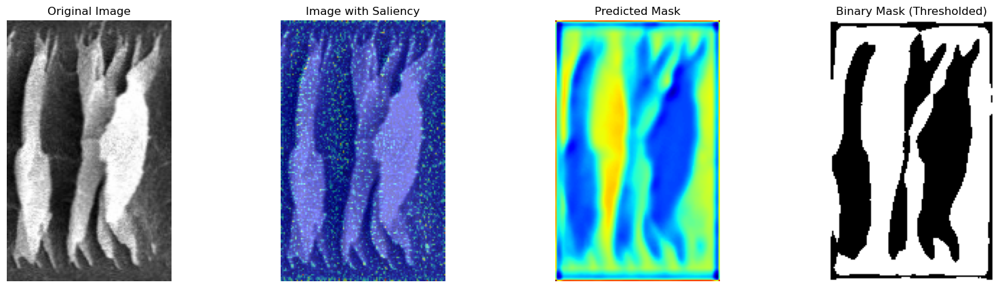

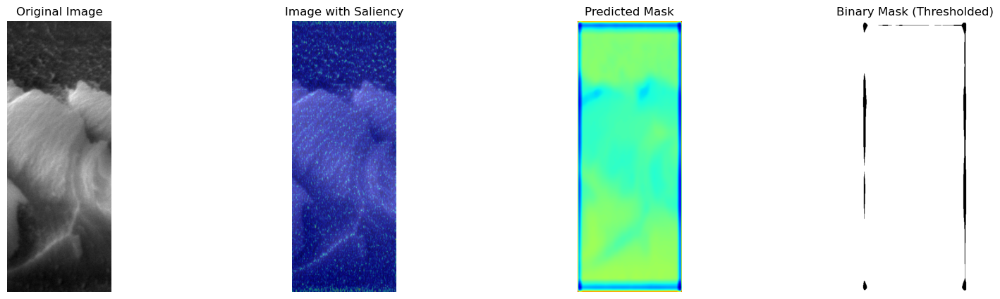

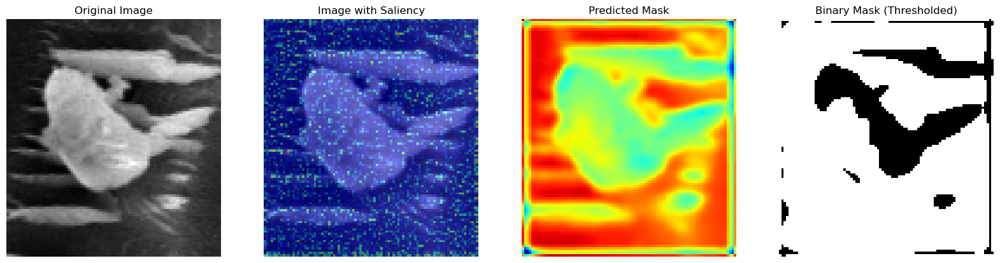

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def predict_full_image_with_saliency_and_binary_mask(image, model, target_size=(224, 224), threshold=0.2):
    """Resize image, predict mask, saliency map, and create binary mask."""
    original_size = image.shape[:2]
    
    # Normalize and add channel + batch dimensions
    resized_image = cv2.resize(image, target_size)
    resized_image = np.expand_dims(resized_image, axis=-1)  # Add channel dimension
    resized_image = np.expand_dims(resized_image, axis=0)   # Add batch dimension
    resized_image = resized_image.astype(np.float32) / 255.0
    
    # Convert image to tensor
    image_tensor = tf.convert_to_tensor(resized_image)
    image_tensor = tf.Variable(image_tensor, dtype=tf.float32)
    
    # Perform model prediction
    with tf.GradientTape() as tape:
        tape.watch(image_tensor)
        prediction = model(image_tensor, training=False)
    
    # Compute the gradient of the prediction with respect to the image
    grads = tape.gradient(prediction, image_tensor)
    saliency_map = tf.reduce_max(tf.abs(grads), axis=-1).numpy().squeeze()
    
    # Resize the saliency map back to the original size
    saliency_map = cv2.resize(saliency_map, (original_size[1], original_size[0]))
    
    # Predict mask
    predicted_mask = prediction[0, :, :, 0].numpy()
    
    # Resize mask back to original image size
    predicted_mask = cv2.resize(predicted_mask, (original_size[1], original_size[0]))
    
    # Generate binary mask using threshold
    binary_mask = (predicted_mask > threshold).astype(np.float32)  # Apply threshold
    
    return predicted_mask, saliency_map, binary_mask

# Example visualization loop with the fourth binary mask
for filename in os.listdir(image_dir)[:10]:
    img_path = os.path.join(image_dir, filename)
    
    # Load image and mask
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    
    if img is None:
        print(f"Skipping {filename} (missing image or mask)")
        continue
    
    # Perform prediction, saliency map generation, and binary mask creation
    predicted_mask, saliency_map, binary_mask = predict_full_image_with_saliency_and_binary_mask(img, model)
    
    # Create the plots
    plt.figure(figsize=(20, 5))
    
    # Plot original image
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis("off")
    
    # Plot image with saliency overlay
    plt.subplot(1, 4, 2)
    plt.imshow(img, cmap='gray')
    plt.imshow(saliency_map, cmap='jet', alpha=0.5)  # Saliency overlay with transparency
    plt.title("Image with Saliency")
    plt.axis("off")
    
    # Plot predicted mask
    plt.subplot(1, 4, 3)
    plt.imshow(predicted_mask, cmap='jet')
    plt.title("Predicted Mask")
    plt.axis("off")
    
    # Plot binary mask
    plt.subplot(1, 4, 4)
    plt.imshow(binary_mask, cmap='gray')
    plt.title("Binary Mask (Thresholded)")
    plt.axis("off")
    
    plt.show()


The next section slides across a larger image, the window size makes a difference in masks produced

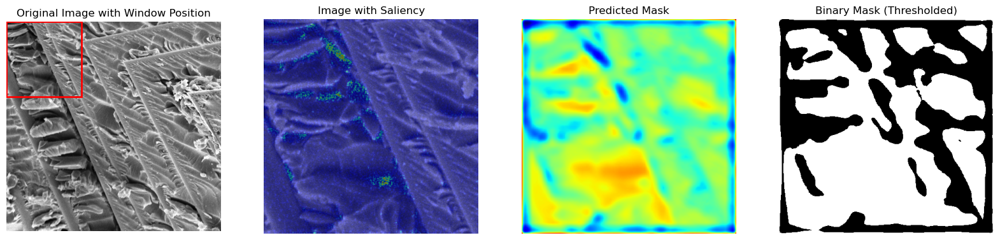

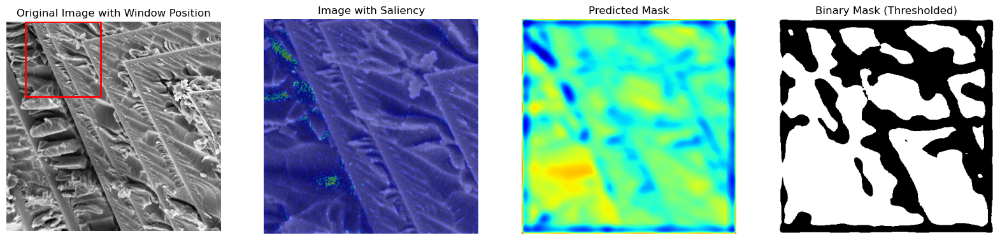

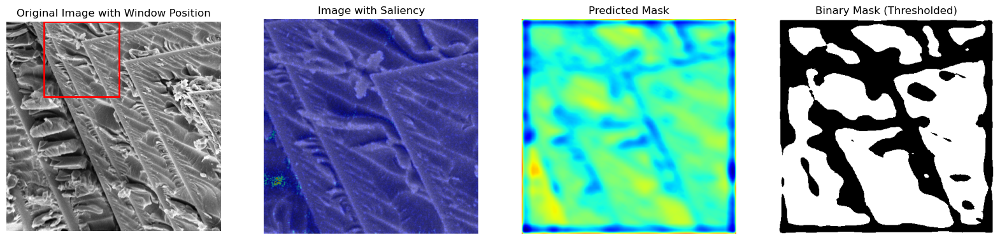

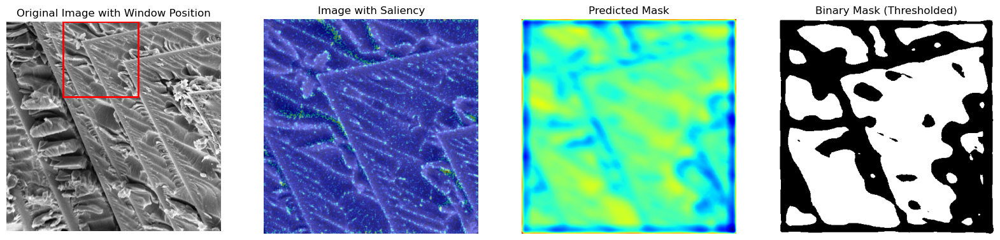

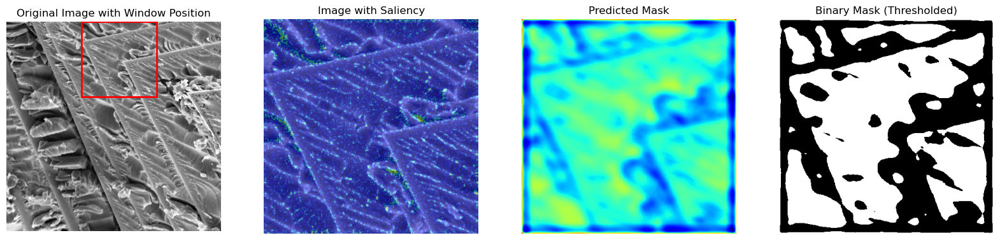

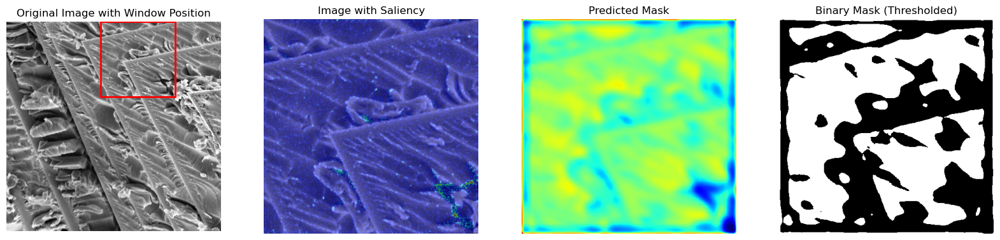

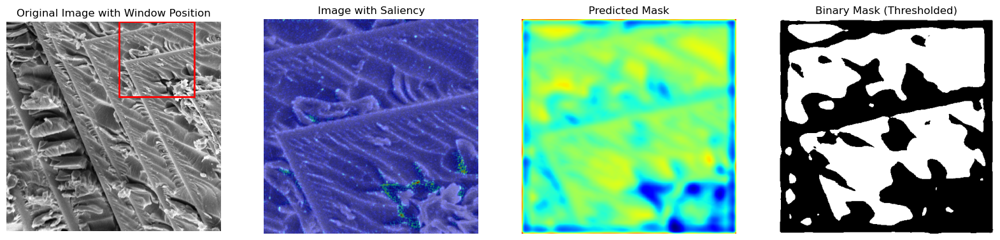

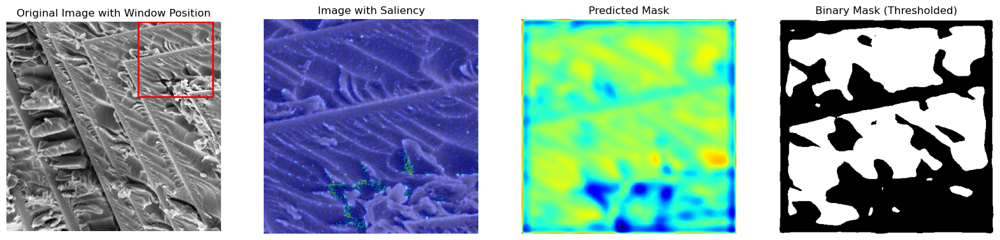

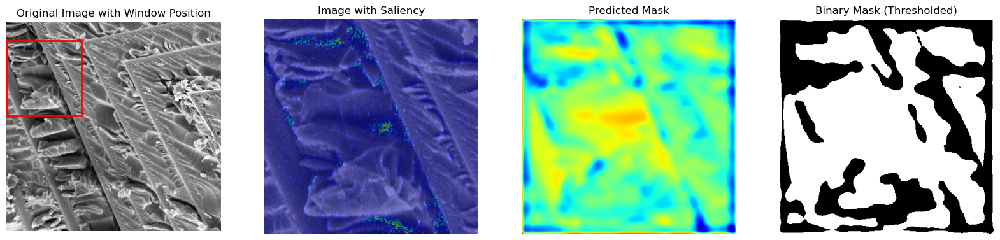

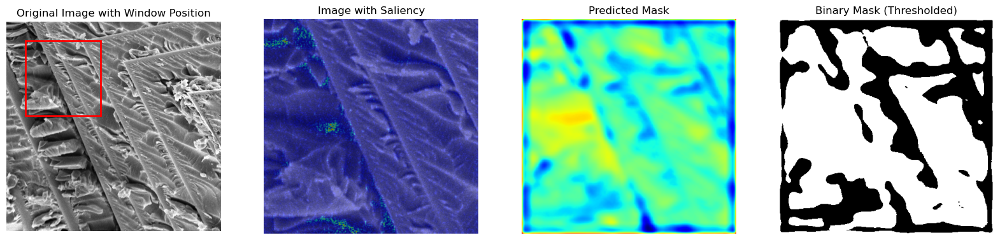

In [48]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
windowsize = 448
def slide_window(image, window_size=(windowsize, windowsize), step_size=windowsize/2):
    patches = []
    h, w = image.shape
    window_height, window_width = window_size
    
    for i in range(0, h - window_height + 1, step_size):  # Sliding with step_size
        for j in range(0, w - window_width + 1, step_size):
            patch = image[i:i + window_height, j:j + window_width]
            patches.append((patch, (i, j)))  # Store patch and its top-left position
    
    return patches

large_image = cv2.imread("/Users/rfalcao/Documents/FYP/ClearCuspsCroppedRotated/1.tif", cv2.IMREAD_GRAYSCALE)
large_image = large_image[:int(large_image.shape[0] * 0.7), int(large_image.shape[1] * 0.5):]
patches = slide_window(large_image, window_size=(windowsize, windowsize), step_size=112)

for idx, (patch, (start_row, start_col)) in enumerate(patches[:10]):  # Limit to first 10 patches for display
    if patch is None:
        continue
    
    predicted_mask, saliency_map, binary_mask = predict_full_image_with_saliency_and_binary_mask(patch, model)
    
    # Create the plots
    plt.figure(figsize=(20, 5))
    
   
    plt.subplot(1, 4, 1)
    plt.imshow(large_image, cmap='gray')
    rect = plt.Rectangle((start_col, start_row), windowsize, windowsize, linewidth=2, edgecolor='r', facecolor='none')  # Mark window position
    plt.gca().add_patch(rect)
    plt.title("Original Image with Window Position")
    plt.axis("off")
    
    plt.subplot(1, 4, 2)
    plt.imshow(patch, cmap='gray')
    plt.imshow(saliency_map, cmap='jet', alpha=0.5)  # Saliency overlay with transparency
    plt.title("Image with Saliency")
    plt.axis("off")
    
    # Plot predicted mask
    plt.subplot(1, 4, 3)
    plt.imshow(predicted_mask, cmap='jet')
    plt.title("Predicted Mask")
    plt.axis("off")
    
    # Plot binary mask
    plt.subplot(1, 4, 4)
    plt.imshow(binary_mask, cmap='gray')
    plt.title("Binary Mask (Thresholded)")
    plt.axis("off")
    
    plt.show()


(1785, 2560)
